In [2]:
%load_ext autoreload
%autoreload 2
import os, sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
f,a = plt.subplots(1,1,figsize=(1e-2, 1e-2))
mpl.rcParams['figure.dpi'] = 180
sns.set_style('darkgrid')
pd.set_option("display.max_columns",999)
pd.set_option("display.max_rows",100)

import warnings
warnings.filterwarnings("ignore")

from tqdm.auto import tqdm
import torch
import torch.nn as nn
import torch.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch import optim
from datetime import datetime as dt

from src.utils import mkdirs, convert_path, pkl_dump, pkl_load, display_side
from src.data_processing import encode_batch_weighted, onehot_batch_decode, onehot_decode, INT_TO_CHAR, get_tensor_dataset, encode_batch, BL62_VALUES, BL62FREQ_VALUES, get_array_dataset
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from src.metrics import get_metrics, plot_roc_auc_fold, get_mean_roc_curve, get_pred_df, get_mean_pr_curve
from src.metrics import get_nested_feature_importance, plot_feature_importance
from src.train_eval import train_loop, nested_kcv_train_nn, evaluate_trained_models_nn
from src.train_eval import kcv_tune_sklearn, evaluate_trained_models_sklearn, nested_kcv_train_sklearn
from src.partition_tools import pipeline_stratified_kfold
from src.utils import pkl_load, pkl_dump

from scipy.stats import ttest_ind, mannwhitneyu, wilcoxon
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier

PAL = sns.color_palette('hsv', n_colors=13)
HSV = [PAL[-4], PAL[-1], PAL[0], PAL [4]]
mpl.rcParams['figure.dpi'] = 180

RESDIR='../output/220906_analysis/'
BOOTDIR='../output/bootstrapping/'

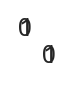

In [3]:
mpl.rcParams['figure.dpi'] = 180
f,a = plt.subplots(1,1,figsize=(1e-3,1e-3))

# init

## reloading datasets

In [12]:
cedar = pd.read_csv('../data/partitioned_traindata_redo/cedar_10fold.csv')
cedar['trainset']='cedar'

cedar_viral_old = pd.read_csv('../data/partitioned_traindata/cedar_viral_10fold.csv')
cedar_viral_old['trainset']='cedar_virus_old'

cedar_viral_more = pd.read_csv('../data/partitioned_traindata_redo/new_cedar_viral_5fold.csv')
cedar_viral_more['trainset']='cedar_virus_new'
# USE PRIME FOR BASELINE VERIFICATION, PRIME_FOLD FOR ACTUAL TRAINING
prime_fold = pd.read_csv('../data/partitioned_traindata_redo/prime_5fold.csv')
prime_fold['trainset']='prime'

prime = pd.read_excel('../data/partitioned_traindata/PRIME_dataset.xlsx', comment = '#', skiprows=2)

viral_only = pd.read_csv('../data/partitioned_traindata_redo/viral_only_5fold.csv')
viral_only['trainset']='virus'

cedar_hp_uni = pd.read_csv('../data/partitioned_traindata/cedar_hp_mixed_rank120_10fold.csv')
cedar_hp_uni['trainset']='cedar_hp_rank_uni'

cedar_hp_low = pd.read_csv('../data/partitioned_traindata/cedar_hp_mixed_10fold.csv')
cedar_hp_low['trainset']='cedar_hp_rank_low'

In [13]:
# ICS DICT
ics_kl = pkl_load('../data/ic_dicts/ics_kl.pkl')
ics_shannon = pkl_load('../data/ic_dicts/ics_shannon.pkl')

MAPPING= {'RandomForestClassifier': 'RF',
          'LogisticRegression': 'LogReg',
          'XGBClassifier': 'XGB',
          'FFN': 'FFN'}

## reloading nnalign etc scores

In [14]:
# nn align
nndir = '../../../nnalign/partitioned_output/_old/'
nnalign_cedar = pd.read_csv(f'{nndir}cedar.pep_39077/cedar.pep_39077.lg6.sorted.pred', sep = '\t')
nnalign_cedar_hp_low = pd.read_csv(f'{nndir}cedar_hp_low.pep_34256/cedar_hp_low.pep_34256.lg6.sorted.pred', sep = '\t')
nnalign_cedar_hp_uni = pd.read_csv(f'{nndir}cedar_hp_uni.pep_28097/cedar_hp_uni.pep_28097.lg6.sorted.pred', sep = '\t')
nnalign_cedar_viral = pd.read_csv(f'{nndir}cedar_viral.pep_2684/cedar_viral.pep_2684.lg6.sorted.pred', sep = '\t')
nnalign_prime = pd.read_csv(f'{nndir}prime.pep_12391/prime.pep_12391.lg6.sorted.pred', sep = '\t')

In [15]:
# PRIME
primedir='../../../gfeller_tools/PRIME/output/'
prime_cedar = pd.read_csv(f'{primedir}cedar_PRIME.out', comment = '#', sep = '\t')
prime_cedar_hp_low = pd.read_csv(f'{primedir}cedar_hp_low_PRIME.out', comment = '#', sep = '\t')
prime_cedar_hp_uni = pd.read_csv(f'{primedir}cedar_hp_uni_PRIME.out', comment = '#', sep = '\t')
prime_cedar_viral = pd.read_csv(f'{primedir}cedar_viral_PRIME.out', comment = '#', sep = '\t')
prime_prime = pd.read_csv(f'{primedir}prime_PRIME.out', comment = '#', sep = '\t')

### Merging w/ baseline scores

In [16]:
import copy
def merging(df, df_nnalign, df_prime):
    df = df.sort_values('Peptide', ascending=True).reset_index(drop=True)
    df_nnalign = df_nnalign.sort_values('Peptide', ascending=True).reset_index(drop=True)
    df_prime = df_prime.sort_values('Peptide', ascending=True).reset_index(drop=True)
    out = copy.deepcopy(df)
    tmp = df_nnalign.rename(columns={'Prediction':'nnalign_score'}).merge(df_prime.rename(columns={'%Rank_bestAllele':'MixMHCrank',
                                                    'Score_bestAllele':'PRIME_score',
                                                    'BestAllele':'MixMHCallele'})[['Peptide', 'MixMHCrank', 'PRIME_score', 'MixMHCallele']],
                           left_index=True, right_index=True)
    out = out.merge(tmp, left_index=True, right_index=True)
    return out

In [287]:
cedar_related_baseline = cedar.merge(cedar_related, left_on=['Peptide', 'HLA', 'trueHLA_EL_rank'],
                                     right_on = ['Peptide', 'HLA', 'trueHLA_EL_rank'],
                                     suffixes=('', '_delme')  # Left gets no suffix, right gets something identifiable
)
# Discard the columns that acquired a suffix
cedar_related_baseline = cedar_related_baseline[[c for c in cedar_related_baseline.columns if not c.endswith('_delme')]]
cedar_related_baseline

,Peptide,HLA,trueHLA_EL_rank,agg_label,fold,BA_rank,BA_score,PMIDs,core,icore,label,len,percentage_pos,pred_EL_rank,pred_EL_score,pred_HLA,responses,total_count,aliphatic_index,boman,hydrophobicity,isoelectric_point,VHSE1,VHSE3,VHSE7,VHSE8,trainset,Core,P1,Measure,nnalign_score,Peptide_x,Gap_pos,Gap_lgt,Insert_pos,Insert_lgt,Core+gap,P1_Rel,Peptide_y,MixMHCrank,PRIME_score,MixMHCallele,wild_type,Related Object_Starting Position,Related Object_Ending Position,wt_true,len_wt,mutation_type,mutation_position,mhc_anchor,anchor_mutation,wt_EL_rank,binder,delta_rank
0,AAAAAAQQIQV,HLA-B07:02,26.7692,0,8,11.9024,0.1632,27198675,AAAAAQIQV,AAAAAAQQIQV,Negative,11,0.0,5.2822,0.0166,HLA-A68:02,Negative,1,116.363636,-0.290909,0.818182,6.100000,0.004545,-0.675455,0.105455,-0.388182,cedar,AAAAAA,0,0.001,0.04789,AAAAAAQQIQV,0,0,0,0,AAAAAA,0.60,AAAAAAQQIQV,4.676,0.008733,B5601,AAAAAAQQLQV,157.0,167.0,True,11,substitution,8,"0,1,3,10",False,25.5667,Conserved,1.2025
1,AAAAQQIQV,HLA-B07:02,4.9092,0,8,0.3045,0.4709,27198675,AAAAQQIQV,AAAAQQIQV,Negative,9,0.0,0.1036,0.6567,HLA-C15:02,Negative,1,120.000000,0.046667,0.600000,6.100000,-0.027778,-0.525556,0.048889,-0.367778,cedar,AQQIQV,3,0.001,0.11765,AAAAQQIQV,0,0,0,0,AQQIQV,0.50,AAAAQQIQV,0.363,0.097263,C1203,AAAAQQLQV,159.0,167.0,True,9,substitution,6,"1,8",False,4.7746,Conserved,0.1346
2,AAAAQQIQV,HLA-A02:01,1.9555,0,8,0.3045,0.4709,27198675,AAAAQQIQV,AAAAQQIQV,Negative,9,0.0,0.1036,0.6567,HLA-C15:02,Negative,1,120.000000,0.046667,0.600000,6.100000,-0.027778,-0.525556,0.048889,-0.367778,cedar,AQQIQV,3,0.001,0.11765,AAAAQQIQV,0,0,0,0,AQQIQV,0.50,AAAAQQIQV,0.363,0.097263,C1203,AAAAQQLQV,159.0,167.0,True,9,substitution,6,"1,3,8",False,2.2847,Improved,-0.3292
3,AAFIWIISM,HLA-B35:01,1.3004,0,9,0.1502,0.6560,27198675,AAFIWIISM,AAFIWIISM,Negative,9,0.0,0.1756,0.3961,HLA-C12:03,Negative,1,152.222222,-2.515556,2.233333,6.100000,0.830000,0.034444,-0.400000,-0.330000,cedar,AAFIWI,0,0.001,0.37003,AAFIWIISM,0,0,0,0,AAFIWI,0.25,AAFIWIISM,0.001,0.331801,C1203,AAFIWIISM,161.0,169.0,True,9,same,-1,"1,8",False,1.3004,Conserved,0.0000
4,AAHFTVLLY,HLA-A11:01,0.4196,0,3,0.1083,0.6509,31511069,AAHFTVLLY,AAHFTVLLY,Negative,9,0.0,0.0256,0.8170,HLA-A30:02,Negative,1,141.111111,-1.456667,1.444444,7.542349,0.571111,-0.022222,-0.167778,-0.212222,cedar,HFTVLL,2,0.001,0.31177,AAHFTVLLY,0,0,0,0,HFTVLL,0.70,AAHFTVLLY,0.011,0.285331,A2902,AAHFTALLY,1949.0,1957.0,True,9,substitution,5,"0,1,8",False,0.5881,Improved,-0.1685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3237,YYPGKKEPF,HLA-A24:02,0.0965,0,5,0.0750,0.7654,"34270940,34270940",YYPGKKEPF,YYPGKKEPF,Negative,9,0.0,0.0301,0.9052,HLA-C14:02,"Negative,Negative",2,0.000000,1.585556,-1.633333,9.121620,-0.060000,0.130000,0.283333,0.535556,cedar,YYPGKK,0,0.001,0.16206,YYPGKKEPF,0,0,0,0,YYPGKK,0.90,YYPGKKEPF,0.037,0.196378,C1402,YYSGKKEPF,260.0,268.0,True,9,substitution,2,"1,8",False,0.0817,Conserved,0.0148
3238,YYPPSQIAQL,HLA-A24:02,0.0566,1,2,0.0780,0.7614,26048577,YYPPSQIAL,YYPPSQIAQL,Positive,10,1.0,0.0418,0.8745,HLA-C14:02,Positive_all,1,88.000000,0.311000,-0.350000,6.086603,0.185000,-0.006000,-0.306000,0.414000,cedar,YYPPSQ,0,1.000,0.11172,YYPPSQIAQL,0,0,0,0,YYPPSQ,0.85,YYPPSQIAQL,0.080,0.155548,C1402,YYPPSQIAQL,422.0,431.0,True,10,same,-1,"1,9",False,0.0566,Conserved,0.0000
3239,YYSKNLNSF,HLA-A24:02,0.0033,1,6,0.0086,0.8124,28423700,YYSKNLNSF,YYSKNLNSF,Positive,9,1.0,0.0033,0.9896,HLA-A24:02,Positive_all,1,43.333333,2.001111,-0.944444,9.145600,-0.043333,0.164444,-0.151111,-0.345556,cedar,YYSKNL,0,1.000,0.17273,YYSKNLNSF,0,0,0,0,YYSKNL,0.65,YYSKNLNSF,0.005,0.294321,A2402,YYSKNLNSS,429.0,437.0,True,9,substitution,8,"1,8",True,4.6860,Improved,-4.6827
3240,YYSKNLNSFF,HLA-A24:02,0.0310,1,8,0.0122,0.7758,"28423700,28423700",YYSKNLNSF,YYSKNLNSFF,Positive,10,1.0,0.0310,0.9225,HLA-A24:02,"Positive_all,Positive_all

In [17]:
cedar = merging(cedar, nnalign_cedar, prime_cedar)
cedar_hp_low = merging(cedar_hp_low, nnalign_cedar_hp_low, prime_cedar_hp_low)
cedar_hp_uni = merging(cedar_hp_uni, nnalign_cedar_hp_uni, prime_cedar_hp_uni)
cedar_viral_old = merging(cedar_viral_old, nnalign_cedar_viral, prime_cedar_viral)
prime = merging(prime.rename(columns={'Mutant':'Peptide'}), nnalign_prime, prime_prime)

### quick roc check

Text(0.5, 1.0, 'baselines for PRIME dataset (w/o HP negs)')

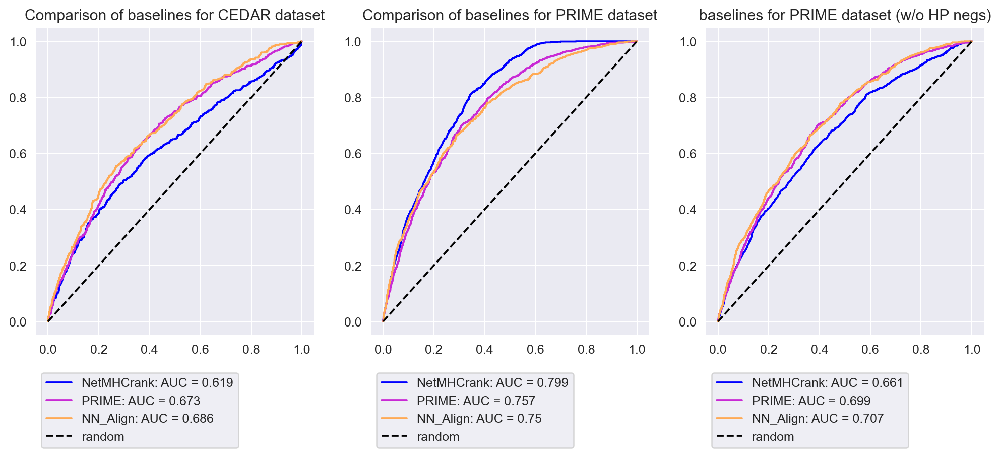

In [18]:
# For CEDAR
from sklearn.metrics import roc_auc_score, roc_curve
#FOR CEDAR
# EL rank
fpr_netmhc, tpr_netmhc, _ = roc_curve(cedar['agg_label'].values,  -1* cedar['trueHLA_EL_rank'].values)
auc_netmhc = roc_auc_score(cedar['agg_label'].values, -1*cedar['trueHLA_EL_rank'].values)
# PRIME
fpr_prime, tpr_prime, _ = roc_curve(cedar['agg_label'].values, cedar['PRIME_score'].values)
auc_prime = roc_auc_score(cedar['agg_label'].values, cedar['PRIME_score'].values)
# nnalign
fpr_nnalign, tpr_nnalign, _ = roc_curve(cedar['agg_label'].values, cedar['nnalign_score'].values)
auc_nnalign = roc_auc_score(cedar['agg_label'].values, cedar['nnalign_score'].values)

sns.set_palette('gnuplot2', n_colors=3)
f,a = plt.subplots(1,3, figsize=(13.5,4.5))
a[0].plot(fpr_netmhc, tpr_netmhc, label = f'NetMHCrank: AUC = {round(auc_netmhc,3)}')
a[0].plot(fpr_prime, tpr_prime, label = f'PRIME: AUC = {round(auc_prime,3)}')
a[0].plot(fpr_nnalign, tpr_nnalign, label = f'NN_Align: AUC = {round(auc_nnalign,3)}')
a[0].plot([0,1],[0,1], label='random', ls = '--', c='k')
a[0].legend(bbox_to_anchor=(0.75, -0.1))
a[0].set_title('Comparison of baselines for CEDAR dataset')
# FOR PRIME
# EL rank
fpr_netmhc, tpr_netmhc, _ = roc_curve(prime['Immunogenicity'].values,  -1* prime['NetMHCpanEL'].values)
auc_netmhc = roc_auc_score(prime['Immunogenicity'].values, -1*prime['NetMHCpanEL'].values)
# PRIME
fpr_prime, tpr_prime, _ = roc_curve(prime['Immunogenicity'].values, prime['PRIME_score'].values)
auc_prime = roc_auc_score(prime['Immunogenicity'].values, prime['PRIME_score'].values)
# nnalign
fpr_nnalign, tpr_nnalign, _ = roc_curve(prime['Immunogenicity'].values, prime['nnalign_score'].values)
auc_nnalign = roc_auc_score(prime['Immunogenicity'].values, prime['nnalign_score'].values)

a[1].plot(fpr_netmhc, tpr_netmhc, label = f'NetMHCrank: AUC = {round(auc_netmhc,3)}')
a[1].plot(fpr_prime, tpr_prime, label = f'PRIME: AUC = {round(auc_prime,3)}')
a[1].plot(fpr_nnalign, tpr_nnalign, label = f'NN_Align: AUC = {round(auc_nnalign,3)}')
a[1].plot([0,1],[0,1], label='random', ls = '--', c='k')
a[1].legend(bbox_to_anchor=(0.75, -0.1))
a[1].set_title('Comparison of baselines for PRIME dataset')


tmp = prime.query('StudyOrigin!="Random"')
fpr_netmhc, tpr_netmhc, _ = roc_curve(tmp['Immunogenicity'].values,  -1* tmp['NetMHCpanEL'].values)
auc_netmhc = roc_auc_score(tmp['Immunogenicity'].values, -1*tmp['NetMHCpanEL'].values)
# PRIME
fpr_prime, tpr_prime, _ = roc_curve(tmp['Immunogenicity'].values, tmp['PRIME_score'].values)
auc_prime = roc_auc_score(tmp['Immunogenicity'].values, tmp['PRIME_score'].values)
# nnalign
fpr_nnalign, tpr_nnalign, _ = roc_curve(tmp['Immunogenicity'].values, tmp['nnalign_score'].values)
auc_nnalign = roc_auc_score(tmp['Immunogenicity'].values, tmp['nnalign_score'].values)
a[2].plot(fpr_netmhc, tpr_netmhc, label = f'NetMHCrank: AUC = {round(auc_netmhc,3)}')
a[2].plot(fpr_prime, tpr_prime, label = f'PRIME: AUC = {round(auc_prime,3)}')
a[2].plot(fpr_nnalign, tpr_nnalign, label = f'NN_Align: AUC = {round(auc_nnalign,3)}')
a[2].plot([0,1],[0,1], label='random', ls = '--', c='k')
a[2].legend(bbox_to_anchor=(0.75, -0.1))
a[2].set_title('baselines for PRIME dataset (w/o HP negs)')

### Baseline fct def

In [298]:
from sklearn.metrics import precision_recall_curve, auc, average_precision_score, roc_curve, roc_auc_score
# PLOT BASELINE FUNCTIONS
def plot_baseline_roc(axis, dataset, remove_hp=False):
    if dataset=='cedar':
        fpr_netmhc, tpr_netmhc, _ = roc_curve(cedar['agg_label'].values,  -1* cedar['trueHLA_EL_rank'].values)
        auc_netmhc = roc_auc_score(cedar['agg_label'].values, -1*cedar['trueHLA_EL_rank'].values)
        # PRIME
        fpr_prime, tpr_prime, _ = roc_curve(cedar['agg_label'].values, cedar['PRIME_score'].values)
        auc_prime = roc_auc_score(cedar['agg_label'].values, cedar['PRIME_score'].values)
        # nnalign
        fpr_nnalign, tpr_nnalign, _ = roc_curve(cedar['agg_label'].values, cedar['nnalign_score'].values)
        auc_nnalign = roc_auc_score(cedar['agg_label'].values, cedar['nnalign_score'].values)
    elif dataset=='prime':
        
        tmp = prime.query('StudyOrigin != "Random"') if remove_hp else prime
        
        fpr_netmhc, tpr_netmhc, _ = roc_curve(tmp['Immunogenicity'].values,  -1* tmp['NetMHCpanEL'].values)
        auc_netmhc = roc_auc_score(prime['Immunogenicity'].values, -1*tmp['NetMHCpanEL'].values)
        # PRIME
        fpr_prime, tpr_prime, _ = roc_curve(tmp['Immunogenicity'].values, tmp['PRIME_score'].values)
        auc_prime = roc_auc_score(prime['Immunogenicity'].values, tmp['PRIME_score'].values)
        # nnalign
        fpr_nnalign, tpr_nnalign, _ = roc_curve(tmp['Immunogenicity'].values, tmp['nnalign_score'].values)
        auc_nnalign = roc_auc_score(tmp['Immunogenicity'].values, tmp['nnalign_score'].values)
    
    axis.plot(fpr_netmhc, tpr_netmhc, label = f'NetMHCrank: AUC = {round(auc_netmhc,3)}',
              linestyle='--', lw=0.75, color='m')
    axis.plot(fpr_prime, tpr_prime, label = f'PRIME: AUC = {round(auc_prime,3)}',
              linestyle='--', lw=0.75, color='g')
    axis.plot(fpr_nnalign, tpr_nnalign, label = f'NN_Align: AUC = {round(auc_nnalign,3)}',
              linestyle='--', lw=0.75, color='c')

    
def plot_baseline_pr(axis, dataset, remove_hp=False):
    if dataset=='cedar':
        precision_netmhc, recall_netmhc, _ = precision_recall_curve(cedar['agg_label'].values,  -1* cedar['trueHLA_EL_rank'].values)
        prauc_netmhc = auc(recall_netmhc, precision_netmhc)
        # PRIME
        precision_prime, recall_prime, _ = precision_recall_curve(cedar['agg_label'].values, cedar['PRIME_score'].values)
        prauc_prime = auc(recall_prime, precision_prime)
        # nnalign
        precision_nnalign, recall_nnalign, _ = precision_recall_curve(cedar['agg_label'].values, cedar['nnalign_score'].values)
        prauc_nnalign = auc(recall_nnalign, precision_nnalign)
        
    elif dataset=='prime':
        tmp = dataset.query('StudyOrigin != "Random"') if remove_hp else prime
        
        precision_netmhc, recall_netmhc, _ = precision_recall_curve(tmp['Immunogenicity'].values,  -1* tmp['NetMHCpanEL'].values)
        prauc_netmhc = auc(recall_netmhc, precision_netmhc)
        # PRIME
        precision_prime, recall_prime, _ = precision_recall_curve(tmp['Immunogenicity'].values, tmp['PRIME_score'].values)
        prauc_prime = auc(recall_prime, precision_prime)
        # nnalign
        precision_nnalign, recall_nnalign, _ = precision_recall_curve(tmp['Immunogenicity'].values, tmp['nnalign_score'].values)
        prauc_nnalign = auc(recall_nnalign, precision_nnalign)
    
    axis.plot(recall_netmhc, precision_netmhc, label = f'NetMHCrank: PRAUC = {round(prauc_netmhc,3)}',
              linestyle='-.', lw=0.45, color='m')
    axis.plot(recall_prime, precision_prime, label = f'PRIME: PRAUC = {round(prauc_prime,3)}',
              linestyle='-.', lw=0.45, color='g')
    axis.plot(recall_nnalign, precision_nnalign, label = f'NN_Align: PRAUC = {round(prauc_nnalign,3)}',
              linestyle='-.', lw=0.45, color='c')


    
def plot_baseline_roc_related(axis, binder, anchor_mutation):
    tmp = cedar_related_baseline.query('binder==@binder and anchor_mutation==@anchor_mutation')
    fpr_netmhc, tpr_netmhc, _ = roc_curve(tmp['agg_label'].values,  -1* tmp['trueHLA_EL_rank'].values)
    auc_netmhc = roc_auc_score(tmp['agg_label'].values, -1*tmp['trueHLA_EL_rank'].values)
    # PRIME
    fpr_prime, tpr_prime, _ = roc_curve(tmp['agg_label'].values, tmp['PRIME_score'].values)
    auc_prime = roc_auc_score(tmp['agg_label'].values, tmp['PRIME_score'].values)
    # nnalign
    fpr_nnalign, tpr_nnalign, _ = roc_curve(tmp['agg_label'].values, tmp['nnalign_score'].values)
    auc_nnalign = roc_auc_score(tmp['agg_label'].values, tmp['nnalign_score'].values)

    axis.plot(fpr_netmhc, tpr_netmhc, label = f'NetMHCrank: AUC = {round(auc_netmhc,3)}',
              linestyle='--', lw=0.75, color='m')
    axis.plot(fpr_prime, tpr_prime, label = f'PRIME: AUC = {round(auc_prime,3)}',
              linestyle='--', lw=0.75, color='g')
    axis.plot(fpr_nnalign, tpr_nnalign, label = f'NN_Align: AUC = {round(auc_nnalign,3)}',
              linestyle='--', lw=0.75, color='c')

# Redo CEDAR filtering from datadump

In [34]:
cedar_full = pd.read_excel('../data/raw/neo_JUN2022_full_res.xlsx', sheet_name='full')
cedar_short = pd.read_excel('../data/raw/neo_JUN2022_full_res.xlsx', sheet_name='short')

## Redo parsing & check we have the same
ALL GOOD

In [35]:
from src.data_processing import AA_KEYS, BL62_VALUES, BL62, BL62FREQ_VALUES
# Reading epi
cedar_epi = pd.read_excel('../data/raw/neo_JUN2022_full_res.xlsx', sheet_name='epitopes')

# Adding the wild-type peptide & Merging the related info with the cedar_epi dump
rel_cols = ['Epitope_Description', 'MHC_Allele Name', 'Related Object_Description', 'Related Object_Starting Position', 'Related Object_Ending Position']#
related = cedar_short.sort_values('Epitope_Description').drop_duplicates(['Epitope_Description', 'MHC_Allele Name'])[rel_cols]
print(1, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)
cedar_epi = cedar_epi.merge(related, left_on=['Epitope_Description', 'MHC_Allele Name'], right_on = ['Epitope_Description', 'MHC_Allele Name'])
print(2, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)
print('After merge', len(cedar_epi))

# Get the length of the peptide & Querying only length 8 to 12 (Only lens for which we have our motifs)
cedar_epi['len'] = cedar_epi['Epitope_Description'].apply(len)
cedar_epi = cedar_epi.query('len>=8 and len <=12')
print(3, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)
print('After len check', len(cedar_epi))

# Filter out XYZ- etc characters in peptide
cedar_epi.drop(index=cedar_epi.loc[cedar_epi['Epitope_Description'].apply(lambda x: any([z for z in x if z not in AA_KEYS]))].index, inplace=True)
print(4, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)
print('After XYZ', len(cedar_epi))

# Keeping on HLA alleles where there is at least one positive Peptide (i.e. discard Alleles with only negatives)
hlas_to_keep = [x for x in cedar_epi.query('label=="Positive"')['MHC_Allele Name'].unique() if 'D' not in x]
print('N HLAs to keep', len(hlas_to_keep))
cedar_epi = cedar_epi.query('`MHC_Allele Name` in @hlas_to_keep')
print(5, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)

print('After HLA positive', len(cedar_epi))

# Keeping only MHC Class I
cedar_epi = cedar_epi.query('not `MHC_Allele Name`.str.contains("D")', engine='python')
print(6, len(cedar_epi.query('Epitope_Description=="CLAVEEVSL"'))==0)
print('After class II', len(cedar_epi))

# Adding some new columns
cedar_epi['total_count'] = cedar_epi['responses'].apply(lambda x: len(x.split(',')))
cedar_epi['percentage_pos'] = (cedar_epi['responses'].apply(lambda x: sum([1 for x in x.split(',') if 'Positive' in x]))/cedar_epi['total_count'])
cedar_epi['agg_label']=cedar_epi['label'].apply(lambda x: 1 if x=='Positive' else 0)

# Renaming columns 
cedar_epi.rename(columns = {'Epitope_Description': 'Peptide',
                            'MHC_Allele Name': 'HLA',
                             'Related Object_Description': 'wild_type'}, inplace=True)
# replacing HLA to simple form
cedar_epi['HLA_full'] = cedar_epi['HLA']
cedar_epi['HLA'] = cedar_epi['HLA_full'].apply(lambda x: x.replace('*','').replace(':',''))

1 False
2 False
After merge 3928
3 False
After len check 3643
4 False
After XYZ 3643
N HLAs to keep 63
5 False
After HLA positive 3480
6 False
After class II 3480


## some align/mutation fct defs

In [36]:
def pipeline_align(query, database, blosum=BL62, gap_open=-1, gap_extension=-1, print_=False):
    P_matrix, Q_matrix, D_matrix, E_matrix, i_max, j_max, max_score = smith_waterman_alignment(query, database, BL62, gap_open, gap_extension)
    aligned_query, aligned_database, matches = smith_waterman_traceback(E_matrix, D_matrix, i_max, j_max, query, database, gap_open, gap_extension)
    if print_:
        return ''.join(aligned_query), ''.join(aligned_database), matches#/len(aligned_query)
    else:
        return matches/len(aligned_query)
    
    
# Only keep Wild Type which are peptides (& not some protein name)
def check_wt(string):
    if ' ' in string:
        return False
    if any([(x not in AA_KEYS) for x in string]):
        return False
    if string != string.upper():
        return False
    else:
        return True

def get_mutation_type(mutant, wildtype):
    if mutant==wildtype:
        return 'same'
    if len(mutant) == len(wildtype):
        return 'substitution'
    elif len(mutant)!=len(wildtype):
        try: 
            aligned_query, aligned_database, matches = pipeline_align(mutant, wildtype, print_=True)
        except:
            print(mutant, wildtype)
        len_align = len(aligned_query)
        if len_align==0:
            return 'else'
        if matches/len_align < 0.6:
            return 'else'     
        else:
            # If mutant longer than wildtype, has to be insertion, except frameshift which 
            # makes the mutant very different
            if len(mutant)>len(wildtype): 
                return 'insertion'
            # Missing amino acids, should be deletions ; could also be frameshift if very different
            if len(mutant)<len(wildtype):
                return 'deletion'
            
def get_mutation_pos(mutant, wildtype, mut_type):
    if mut_type=='same':
        return -1
    if mut_type=='substitution':
        return [x!=y for x,y in zip(mutant,wildtype)].index(True)
    else:
        return -1

def get_anchor(pep_len, allele, ic_dict, rank=0.25, threshold=0.16):
    """
    rank is the % rank at which we take the IC
    threshold is the threshold for info content to count as anchor
    """
    info_content = ic_dict[pep_len][allele][rank]
    return ','.join(np.where(info_content>=threshold)[0].astype(str))

In [53]:
alphabet_file = '../data/' + "Matrices/alphabet"
alphabet = np.loadtxt(alphabet_file, dtype=str)
blosum_file = '../data/' + "Matrices/BLOSUM50"
_blosum50 = np.loadtxt(blosum_file, dtype=float).reshape((24, -1)).T

blosum50 = {}

for i, letter_1 in enumerate(alphabet):
    
    blosum50[letter_1] = {}

    for j, letter_2 in enumerate(alphabet):
        
        blosum50[letter_1][letter_2] = _blosum50[i, j]

def smith_waterman_alignment(query="VLLP", database="VLILP", scoring_scheme={}, gap_open=-2, gap_extension=-1):

    # Matrix imensions
    M = len(query)
    N = len(database)
    
    # D matrix change to float
    D_matrix = np.zeros((M+1, N+1), np.int)

    # P matrix
    P_matrix = np.zeros((M+1, N+1), np.int)
    
    # Q matrix
    Q_matrix = np.zeros((M+1, N+1), np.int)

    # E matrix
    E_matrix = np.zeros((M+1, N+1), dtype=object)

    # Initialize matrices
    for i in range(M, 0, -1):
        # Here you might include  penalties for end gaps, i.e
        # alignment_matrix[i-1, N] = alignment_matrix[i, N] + gap_open
        D_matrix[i-1, N] = 0
        P_matrix[i-1, N] = 0
        Q_matrix[i-1, N] = 0
        E_matrix[i-1, N] = 0

    for j in range(N, 0, -1):
        # Here you might include  penalties for end gaps, i.e
        #alignment_matrix[M, j-1] = alignment_matrix[M, j] + gap_open
        D_matrix[M, j-1] = 0
        P_matrix[M, j-1] = 0
        Q_matrix[M, j-1] = 0
        E_matrix[M, j-1] = 0

        
    # Main loop
    D_matrix_max_score, D_matrix_i_max, D_matrix_i_max = -9, -9, -9
    for i in range(M-1, -1, -1): 
        for j in range(N-1, -1, -1):
            
            # Q_matrix[i,j] entry
            gap_open_database = D_matrix[i+1,j] + gap_open
            gap_extension_database = Q_matrix[i+1,j] + gap_extension
            max_gap_database = max(gap_open_database, gap_extension_database)
            
            Q_matrix[i,j] = max_gap_database
                
            # P_matrix[i,j] entry
            gap_open_query = D_matrix[i,j+1] + gap_open
            gap_extension_query = P_matrix[i,j+1] + gap_extension
            max_gap_query = max(gap_open_query, gap_extension_query)
            
            P_matrix[i,j] = max_gap_query
            
            # D_matrix[i,j] entry
            diagonal_score = D_matrix[i+1,j+1]+blosum50[database[j]][query[i]]
            
            # E_matrix[i,j] entry
            candidates = [(1, diagonal_score),
                          (2, gap_open_database),
                          (4, gap_open_query),
                          (3, gap_extension_database),
                          (5, gap_extension_query)]
            
            direction, max_score = max(candidates, key=lambda x: x[1])
            
            # check entry sign
            if max_score > 0:
                E_matrix[i,j] = direction
                D_matrix[i, j] = max_score
            else:
                E_matrix[i,j] = 0
                D_matrix[i, j] = 0

            # fetch global max score
            if max_score > D_matrix_max_score:
                D_matrix_max_score = max_score
                D_matrix_i_max = i
                D_matrix_j_max = j
            
    return P_matrix, Q_matrix, D_matrix, E_matrix, D_matrix_i_max, D_matrix_j_max, D_matrix_max_score

def smith_waterman_traceback(E_matrix, D_matrix, i_max, j_max, query="VLLP", database="VLILP", gap_open=-2, gap_extension=-1):
    
    M = len(query)
    N = len(database)
    
    aligned_query = []
    aligned_database = []
    positions = []
    matches = 0
    
    # start from max_i, max_j
    i, j = i_max, j_max
    while i < M and j < N :

        positions.append([i,j])
        
        # E[i,j] = 0, stop back tracking
        if E_matrix[i, j] == 0:
            break
        
        # E[i,j] = 1, match
        if E_matrix[i, j] == 1:
            aligned_query.append(query[i])
            aligned_database.append(database[j])
            if (query[i] == database[j]):
                matches += 1
            i += 1
            j += 1
        
        
        # E[i,j] = 2, gap opening in database
        if E_matrix[i, j] == 2:
            aligned_database.append("-")
            aligned_query.append(query[i])
            i += 1

            
        # E[i,j] = 3, gap extension in database
        if E_matrix[i, j] == 3:
            
            count = i + 2
            score = D_matrix[count, j] + gap_open + gap_extension

            # Find length of gap (check if score == D_matrix[i, j])
            while((score - D_matrix[i, j])*(score - D_matrix[i, j]) >= 0.00001): 
                count += 1
                score = D_matrix[count, j] + gap_open + (count-i-1)*gap_extension

            for k in range(i, count):
                aligned_database.append("-")
                aligned_query.append(query[i])
                i += 1
             
          
        # E[i,j] = 4, gap opening in query
        if E_matrix[i, j] == 4:
            aligned_query.append("-")
            aligned_database.append(database[j])
            j += 1
        
        
        # E[i,j] = 5, gap extension in query
        if E_matrix[i, j] == 5:
            
            count = j + 2
            score = D_matrix[i, count] + gap_open + gap_extension
            
            # Find length of gap (check if score == D_matrix[i, j])
            while((score - D_matrix[i, j])*(score - D_matrix[i, j]) >= 0.0001): 
                count += 1
                score = D_matrix[i, count] + gap_open + (count-j-1)*gap_extension

            for k in range(j, count):
                aligned_query.append("-")
                aligned_database.append(database[j])
                j += 1
                

    return aligned_query, aligned_database, matches
database = 'RSQWVLRGAE'
query = 'KITQNSKK'
scoring_scheme = blosum50
gap_open = -2
gap_extension = -1
P_matrix, Q_matrix, D_matrix, E_matrix, i_max, j_max, max_score = smith_waterman_alignment(query, database, scoring_scheme, gap_open, gap_extension)
aligned_query, aligned_database, matches = smith_waterman_traceback(E_matrix, D_matrix, i_max, j_max, query, database, gap_open, gap_extension)

print("QAL", ''.join(aligned_query))
print("DAL", ''.join(aligned_database))

QAL KITQ
DAL R-SQ


## apply

In [52]:
cedar_epi['wt_true'] = cedar_epi['wild_type'].apply(check_wt)
cedar_epi['len_wt'] = cedar_epi['wild_type'].apply(len)
# Only keep those that have the true wild-type peptide indicated and not something else
cedar_epi = cedar_epi.query('wt_true==True')
print(len(cedar_epi.query('Peptide=="CLAVEEVSL"'))==0)
print(len(cedar_epi))

True
3466


In [55]:
cedar_epi['mutation_type'] = cedar_epi.apply(lambda x: get_mutation_type(x['Peptide'], x['wild_type']), axis=1)
cedar_epi['mutation_position'] = cedar_epi.apply(lambda x: get_mutation_pos(x['Peptide'], x['wild_type'], x['mutation_type']), axis=1)
cedar_epi['mhc_anchor'] = cedar_epi.apply(lambda x: get_anchor(x['len'], x['HLA'], ics_kl), axis=1)
cedar_epi['anchor_mutation'] = cedar_epi.apply(lambda x: str(x['mutation_position']) in x['mhc_anchor'], axis=1)

### Quick checks & filtering

In [56]:
# Quick check
res = []
for x,y in cedar_epi.query('len_wt != len and wt_true ==True')[['Peptide', 'wild_type']].drop_duplicates().values:
    percents = pipeline_align(x,y, print_=False)
    res.append({'Peptide':x,
                'wild_type':y,
                'percent_match':percents})
df_match = pd.DataFrame(res)

In [57]:
for t in [.3, .4, .5, .66, .7, .75]:
    tmp = df_match.query('percent_match<=@t')
    print(t, len(tmp),'\n',tmp.sample(3))

0.3 34 
         Peptide    wild_type  percent_match
108  VLKNHKLLSK  RRIDCLRQADK       0.200000
81   RNYRQSSNMK  VLLRVTESVLK       0.300000
31     HMADVSLR   KTVPDGKLVK       0.285714
0.4 58 
       Peptide    wild_type  percent_match
31   HMADVSLR   KTVPDGKLVK       0.285714
25  GLANQQSLK     AIYKQSQH       0.333333
53  KVRCSGLHK  QTFLSEIRWEK       0.222222
0.5 69 
         Peptide    wild_type  percent_match
108  VLKNHKLLSK  RRIDCLRQADK       0.200000
65    MLNNSTQTY  KMPEMHFKAPK       0.100000
19     FLKTWNPK   VMLRVQPDGK       0.333333
0.66 74 
        Peptide  wild_type  percent_match
99  TAYPNSIPLV   FIMKSSNL       0.222222
46   KLYPKLSRK   GLRHEVLK       0.300000
83  RSQWVLRGAK  ASGNCGTRK       0.500000
0.7 79 
        Peptide    wild_type  percent_match
37  ISVPFSAKRK  WISVPFSRTLK       0.666667
7   ALQEQWLQAV  AAFDVGRITEV       0.153846
98   TARKCTGGK   RAYEAHDENK       0.181818
0.75 84 
       Peptide   wild_type  percent_match
59   LTINSIFY   FVQRYLGLY       0.400000
38   I

### netmhcpan

In [76]:
# Saving only the wild-type peps that are longer than 8 aa 
cedar_related = cedar_epi.query('len_wt>8')
cedar_related['wild_type'].to_csv('../../../kern_dist/cedar_related.pep', index=False, header=False)

In [77]:
# Ranks stuff
from src.utils import read_netmhcpan_results, flatten_level_columns
from src.utils import get_trueHLA_EL_rank
related_xls = read_netmhcpan_results('../../../netmhcpan/score_cedar/output/cedar_related.pep.xls')
# Manually drop this stupid peptide from dataset
related_xls = related_xls.drop(related_xls.loc[related_xls[("base", "Peptide")] == "CLAVEEVSL"].index)
# Score & merge
related_scored = get_trueHLA_EL_rank(cedar_related.drop(columns=['Peptide']).rename(columns={'wild_type':'Peptide'}),
                                     related_xls).rename(columns={'Peptide':'wild_type',
                                                          'trueHLA_EL_rank': 'wt_EL_rank'})[['wild_type', 'wt_EL_rank']]

# Assert that all values are identical (i.e. in the same order otherwise breaks) so I can reset index and merge in index instead
assert all(cedar_related['wild_type'].values==related_scored['wild_type'].values)==True, 'break'
cedar_related = cedar_related.reset_index(drop=True).merge(related_scored.reset_index(drop=True)[['wt_EL_rank']], left_index=True,right_index=True)

In [78]:
cedar_related['HLA']= cedar_related['HLA'].apply(lambda x: x[:7]+':'+x[7:])
cedar_related=cedar[list(cedar.columns[:18])+['trainset']].drop(columns='fold').merge(cedar_related.drop(columns = ['PMIDs', 'responses','label', 'HLA_full', 
                                                                                                                    'len', 'total_count', 'percentage_pos']),
                                                   left_on=['Peptide', 'HLA', 'agg_label'], right_on=['Peptide','HLA','agg_label'])

cedar_related.to_csv('../data/220920_cedar_related_scored.csv', index=False)

### Get AA props and rearrange columsn

In [75]:
cols = ['Peptide', 'agg_label', 'HLA', 'trueHLA_EL_rank', 'len', 'wild_type', 'wt_EL_rank', 'len_wt', 'mutation_type', 'mutation_position', 'anchor_mutation', 'mhc_anchor']
cedar_related = cedar_related[cols+ list(cedar_related.columns.difference(cols))[::-1]]
cedar_related.to_csv('../data/220920_cedar_related_scored.csv', index=False)


In [82]:
from src.data_processing import get_aa_properties
a, b = get_aa_properties(cedar_related)
a.to_csv('../data/220920_cedar_related_scored.csv', index=False)

# Check performance with respect to different mutation positiosn

## Redef bootstrapping stuff in case needed here

In [84]:
# BOOTSTRAP FUNCTIONS
from joblib import Parallel, delayed
from functools import partial
from src.metrics import get_metrics


def bootstrap_wrapper(y_score, y_true, seed):    
    np.random.seed(seed)
    sample_idx = np.random.randint(0, len(y_score), len(y_score))
    sample_score = y_score[sample_idx]
    sample_true = y_true[sample_idx]
    
    test_results = get_metrics(sample_true, sample_score)
    
    # Save to get mean curves after
    roc_curve = (test_results.pop('roc_curve'), test_results['auc'])
    # Same
    pr_curve = (test_results.pop('pr_curve'), test_results['prauc'])
    return pd.DataFrame(test_results, index=[0]), roc_curve 


def bootstrap_eval(y_score, y_true, n_rounds=10000, n_jobs=16):
    wrapper = partial(bootstrap_wrapper, 
                      y_score=y_score, y_true=y_true)
    print('Sampling')
    output = Parallel(n_jobs=n_jobs)(delayed(wrapper)(seed=seed) for seed in tqdm(range(n_rounds), desc='Bootstrapping rounds', position=1))
    
    print('Making results DF and curves')
    result_df = pd.concat([x[0] for x in output])
    mean_roc_curve = get_mean_roc_curve([x[1] for x in output])
    # mean_pr_curve = get_mean_pr_curve([x[2] for x in output])
    return result_df, mean_roc_curve

def load_hyperparams(encoding_kwargs, train_dataset, MAPPING, model, blosum_matrix=None, weight = None):
    outdict = {'trainset': train_dataset['trainset'].unique()[0],
                       'model': MAPPING[model.__class__.__name__],
                       'weight': weight} # Hardcoded here
        
    outdict.update({k: v for k, v in encoding_kwargs.items() if k != 'blosum_matrix'})
    
    if blosum_matrix is not None:
        bl_name = 'BL62LO' if blosum_matrix['A'].dtype == np.int64 else 'BL62FREQ'
        outdict['blsm'] = bl_name
        
    outname = '_'.join([f'{k}{v}' for k, v in outdict.items() if k!='invert'])
    
    if blosum_matrix is not None:
        bl_name = 'BL62LO' if blosum_matrix['A'].dtype == np.int64 else 'BL62FREQ'
        outdict['blsm'] = bl_name
        
    pkl_name = convert_path(os.path.join(f'../output/tuning/{MAPPING[model.__class__.__name__].lower()}_bootstrap', (outname + '.pkl')).replace('//', '/'))
    hyperparams = pkl_load(pkl_name)
    if 'max_depth' in hyperparams:
        if np.isnan(hyperparams['max_depth']):
            hyperparams['max_depth'] = None
        else:
    
            hyperparams['max_depth'] = int(hyperparams['max_depth'])
    
    for k in [x for x in hyperparams.keys() if x.startswith('n_')]:
        # converts n_estimators, n_layers, n_in, n_hidden, to int
        hyperparams[k] = int(hyperparams[k])
    return hyperparams

## Redo training because don't contain pipelines

In [113]:
from src.data_processing import BL62_VALUES, BL62FREQ_VALUES
from src.train_eval import nested_kcv_train_tmp, evaluate_trained_models_tmp
encoding_kwargs = {'max_len': 12,
                   'encoding': 'onehot',
                   'blosum_matrix': None,
                   'mask': False,  # Using Shannon ICs, true if both mask and name is "shannon"
                   'add_rank': True,
                   'add_aaprop': False,
                   'remove_pep': False,
                   'standardize': True}
train_dataset = cedar
enc_weight_results = {}
model = RandomForestClassifier(n_jobs=1, min_samples_leaf = 7)
tmp_prime = prime_fold.query('StudyOrigin != "Random"').rename(columns={'Allele':'HLA',
                                                                        'Immunogenicity':'agg_label',
                                                                        'NetMHCpanEL':'trueHLA_EL_rank'})
cedar_related['binder'] = cedar_related.apply(lambda x: 'Improved' if x['trueHLA_EL_rank']/x['wt_EL_rank']<.95 else 'Conserved', axis=1)

for encoding, blosum_matrix, blsm_name in tqdm(zip(['onehot','blosum', 'blosum'], 
                                              [None, BL62_VALUES, BL62FREQ_VALUES],
                                              ['onehot','BL62LO', 'BL62FREQ']),
                                              desc = 'encoding', leave=True, position=0):
    
    encoding_kwargs['encoding']=encoding
    encoding_kwargs['blosum_matrix']=blosum_matrix
    enc_weight_results[blsm_name] = {}
    for invert in [True, False]:  
        for ic_name, ics_dict in tqdm(zip(['Mask', 'KL', 'None', 'Shannon'], [ics_shannon, ics_kl, None, ics_shannon]),
                                 desc = 'Weighting', leave=True, position=1):  
            encoding_kwargs['invert'] = invert
            encoding_kwargs['mask'] = True if 'Mask' in ic_name else False
            
            trainset_name = train_dataset.trainset.unique().item()
            ###################################################
            # THIS BLOCK IS COPIED FROM THE NESTED KCV SCRIPT #
            ###################################################
            hyperparams = load_hyperparams(encoding_kwargs, train_dataset, MAPPING, model, blosum_matrix, weight=ic_name)
            if invert:
                if ic_name=='None':
                    continue
                ic_name = 'Inverted '+ic_name

            enc_weight_results[blsm_name][ic_name]={}
            model.set_params(**hyperparams)
    
            ###################################################
            trained_models, train_metrics, _ = nested_kcv_train_tmp(train_dataset, model, ics_dict=ics_dict,
                                                            encoding_kwargs=encoding_kwargs)
            cedar_results, cedar_predictions = evaluate_trained_models_tmp(cedar_related, trained_models, ics_dict, train_dataset, 
                                                                           encoding_kwargs, concatenated=True, only_concat=False)
            prime_results, prime_predictions = evaluate_trained_models_tmp(tmp_prime, trained_models, ics_dict, train_dataset, 
                                                                           encoding_kwargs, concatenated=True, only_concat=False)
            
            enc_weight_results[blsm_name][ic_name]['model'] = trained_models
            enc_weight_results[blsm_name][ic_name]['cedar_results'] = cedar_results
            enc_weight_results[blsm_name][ic_name]['cedar_df'] = cedar_predictions            
            enc_weight_results[blsm_name][ic_name]['prime_results'] = prime_results
            enc_weight_results[blsm_name][ic_name]['prime_df'] = prime_predictions            

encoding: 0it [00:00, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Weighting: 0it [00:00, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Outer fold:   0%|          | 0/10 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Inner Folds:   0%|          | 0/9 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

Eval Folds:   0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:
v2['cedar_df'].groupby(['mutation_type', 'anchor_mutation', 'binder']).agg(count=('pred','count'))

count
mutation_type anchor_mutation binder          
deletion      False           Conserved      1
                              Improved      14
else          False           Conserved     25
                              Improved      28
insertion     False           Conserved      4
                              Improved       3
same          False           Conserved    100
substitution  False           Conserved    941
                              Improved    1066
              True            Conserved    207
                              Improved     853

In [294]:
# Bootstrapping
all_results_df = []
all_results_rocs = {}
for k1, v1 in enc_weight_results.items():
    all_results_rocs[k1] = {}
    for k2, v2 in v1.items():
        all_results_rocs[k1][k2] = {}
        tmp = v2['cedar_df'].query('mutation_type=="substitution"')
        # tmp = cedar_predictions
        for binder in ['Improved', 'Conserved']:
            all_results_rocs[k1][k2][binder]={}
            for anchor_mutation in [True, False]:
                anc_name = 'Anchor Mutation' if anchor_mutation else 'Non-anchor Mutation'
                df = tmp.query('binder==@binder and anchor_mutation==@anchor_mutation')
                
                y_scores = df['pred'].values
                y_true = df['agg_label'].values
                
                results_df, mean_rocs = bootstrap_eval(y_score = y_scores,
                                                  y_true = y_true, 
                                                  n_rounds=10000, n_jobs = 8)
                
                results_df['encoding'] = k1
                results_df['weight'] = k2
                results_df['binder'] = binder
                results_df['mutation'] = anc_name
                all_results_df.append(results_df)
                all_results_rocs[k1][k2][binder][anchor_mutation]=mean_rocs

Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves
Sampling


Bootstrapping rounds:   0%|          | 0/10000 [00:00<?, ?it/s]

Making results DF and curves


### aucs violin

In [ ]:
mpl.rcParams['figure.dpi']=300
df_all = pd.concat(all_results_df)

In [295]:
df_all.to_csv('../output/bootstrapping/df_aucs_binder_mutations.csv', index=False)

In [282]:
f,a = plt.subplots(3,1, figsize=(22.5,30), sharex=False)

z = lambda x: x['binder'] + ' Binder, ' + 'Anchor' if x['mutation']=='Anchor Mutation'\
              else x['binder']+ ' Binder, '+'Not Anchor'
for i, encoding in enumerate(["onehot", "BL62LO", "BL62FREQ"]):
    wtf = str(encoding)
    df_tmp = df_all.query('encoding==@wtf')
    df_tmp['BinderMutation'] = df_tmp.apply(lambda x: z(x), axis=1)
    hue_order = ['Mask', 'Shannon', 'KL', 'None', 'Inverted Mask', 'Inverted Shannon', 'Inverted KL']
    x_order = ['Conserved Binder, Anchor', 'Conserved Binder, Not Anchor', 
               'Improved Binder, Anchor', 'Improved Binder, Not Anchor']
    sns.set_palette('gnuplot2',n_colors=7)
    sns.violinplot(data=df_tmp, y = 'auc',
                   x='BinderMutation', hue = 'weight', hue_order=hue_order,cut=0,
                   order=x_order, width = .85, dodge=True, ax = a[i])
    a[i].legend(loc='lower right', fontsize=12)
    a[i].set_ylim([.425, .915])
    plt.setp(a[i].collections, alpha=.75)
    a[i].set_xticklabels(a[i].get_xticklabels(), fontsize=15, fontweight='semibold')
    a[i].set_ylabel('Test AUC (CEDAR)', fontsize=15, fontweight='semibold')
    a[i].set_xlabel('Binder Type & Mutation position (vs wild-type)',
                 fontsize=15, fontweight='semibold')
    a[i].set_title(f'Comparison of test AUCs for Random Forest model trained on CEDAR with {wtf} encoding'\
                '\nBootstrapped test set AUC for different types of binders and mutation positions',
               fontsize=18, fontweight='bold')
    # if i<2:
        # a[i].set_xlabel('')
f.tight_layout()
f.savefig('../violin_weights_binders.png', dpi=300)

### ROCs ?

In [277]:
HSV5 = HSV+[sns.color_palette('hsv',n_colors=16)[8]]

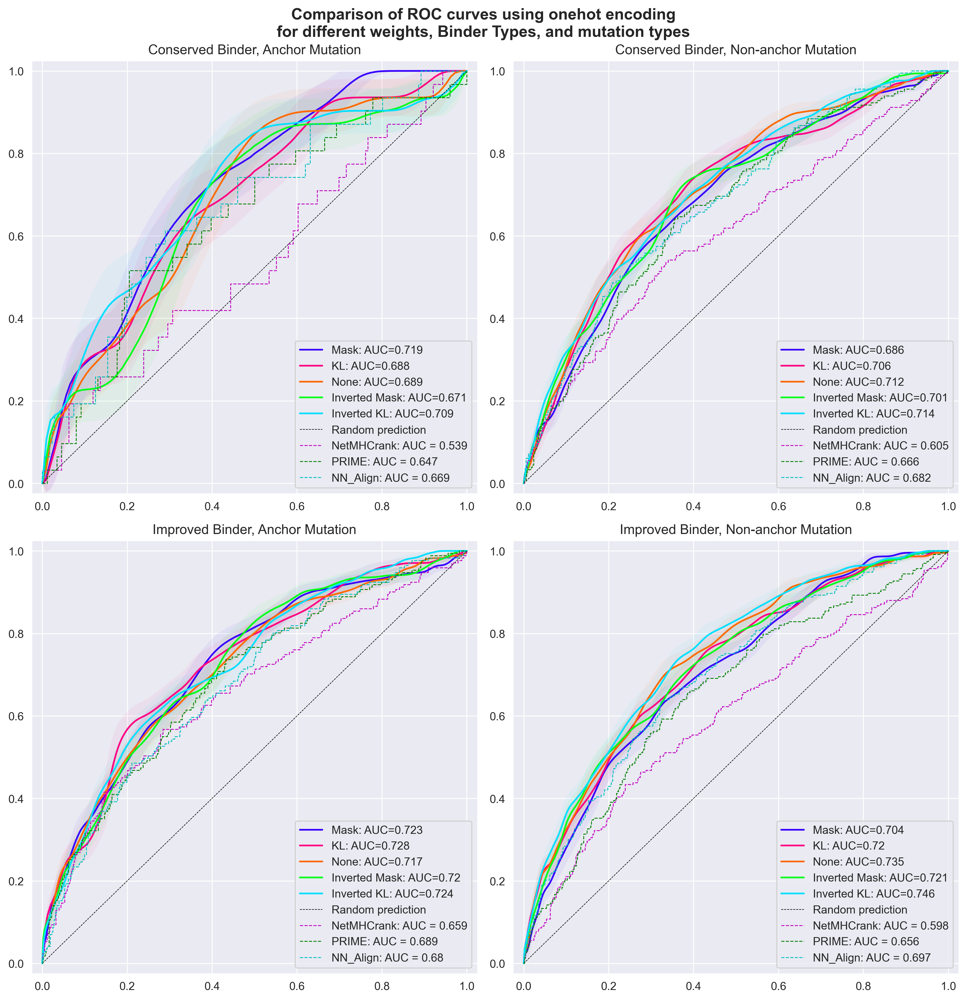

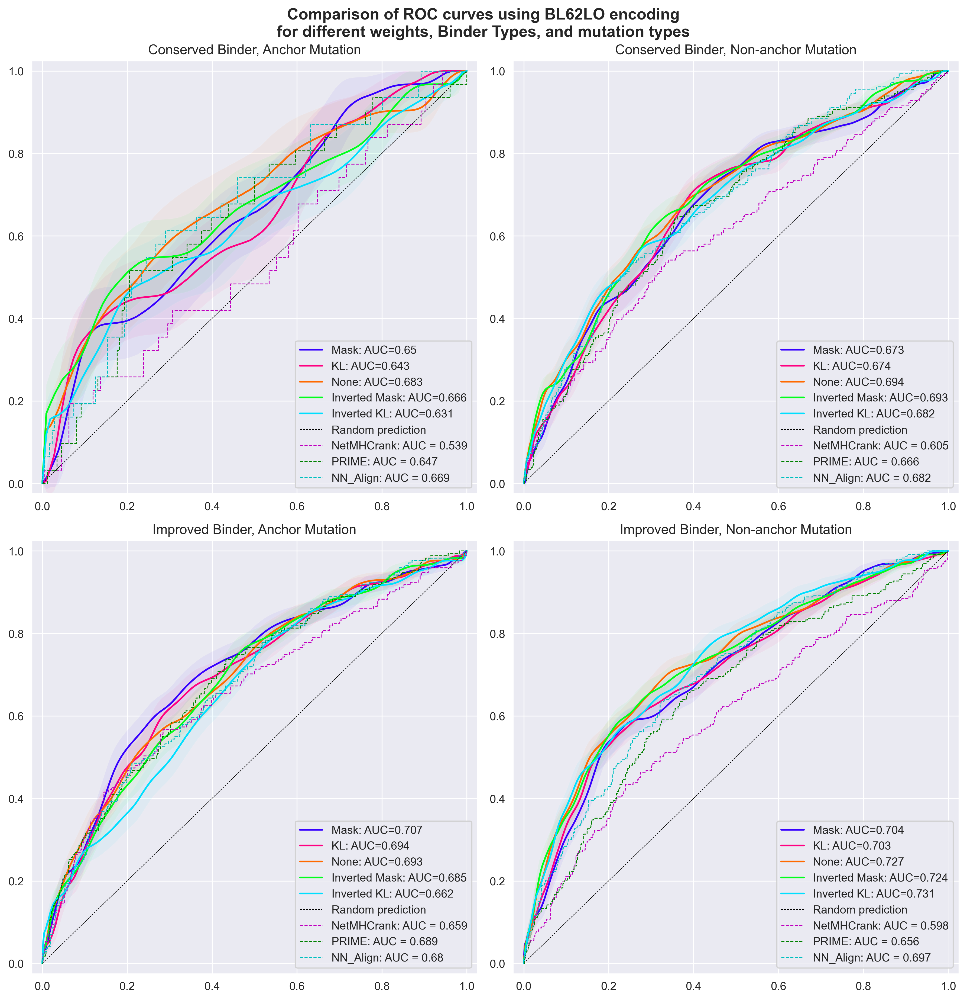

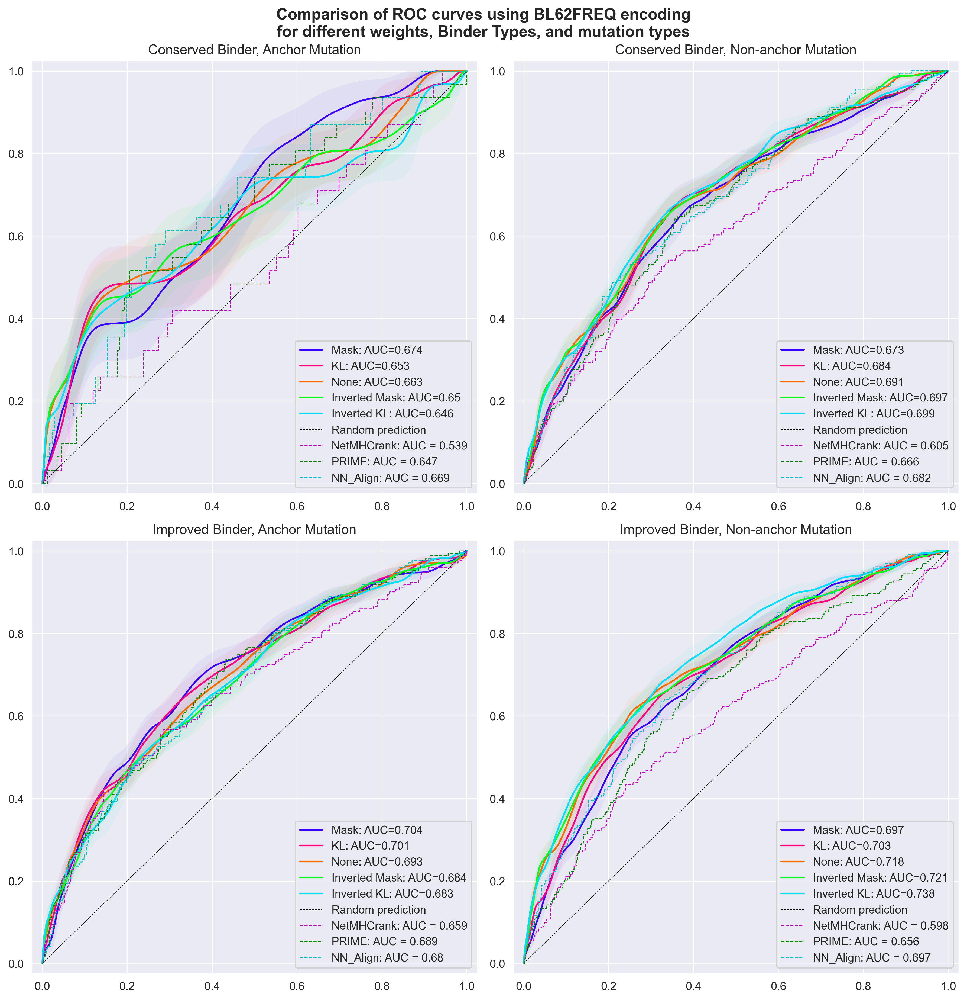

In [300]:
for encoding in ['onehot', 'BL62LO', 'BL62FREQ']:
    f,a = plt.subplots(2,2, figsize=(12,12.5))
    ax = a.ravel()
    i=0
    weights = ['Mask', 'KL', 'None', 'Inverted Mask', 'Inverted KL']
    for binder in ['Conserved', 'Improved']:
        for anchor_mutation, key in zip(['Anchor Mutation', 'Non-anchor Mutation'],
                                        [True, False]):
            rocs_list = [all_results_rocs[encoding][weight][binder][key] \
                         for weight in weights]
            sns.set_palette(HSV5)
            for rocs,weight in zip(rocs_list, weights):
                
                sns.lineplot(x=rocs[0],y=rocs[1], ax=ax[i], 
                             label = f'{weight}: AUC={round(rocs[4],3)}', estimator=None)
                ax[i].fill_between(np.linspace(0, 1, len(rocs[0])), rocs[2], rocs[3], alpha=0.05)
                
            ax[i].plot([0,1], [0,1], ls = '--', lw= 0.5, label = 'Random prediction', c='k')
            ax[i].set_ylim([-.025,1.025])
            ax[i].set_xlim([-.025,1.025])
            plot_baseline_roc_related(axis=ax[i], binder=binder, anchor_mutation=key)
            ax[i].legend(loc='lower right')
            ax[i].set_title(f'{binder} Binder, {anchor_mutation}')
            i+=1
    f.suptitle(f'Comparison of ROC curves using {encoding} encoding\nfor different weights, Binder Types, and mutation types',
              fontsize=14, fontweight='semibold')
    f.tight_layout()
    f.savefig(f'../{encoding}_weight_binder_mut_ROCS.png', dpi=300)

## Delta Features?

In [191]:
from src.data_processing import batch_compute_frequency, encode_batch_weighted
train_immun= cedar.query('fold!=0 and fold!=1 and agg_label==1')
train_non = cedar.query('fold!=0 and fold!=1 and agg_label==0')
x_train_immun = batch_compute_frequency(encode_batch_weighted(train_immun, None, 'cpu', 12, 'onehot', None,
                                              'Peptide', 'HLA', 'agg_label', 'trueHLA_EL_rank', mask=False, invert=False).numpy())
x_train_non = batch_compute_frequency(encode_batch_weighted(train_non, None, 'cpu', 12, 'onehot', None,
                                              'Peptide', 'HLA', 'agg_label', 'trueHLA_EL_rank', mask=False, invert=False).numpy())

freq_imm = x_train_immun.sum(axis=0)/x_train_immun.shape[0]
freq_non = x_train_non.sum(axis=0)/x_train_non.shape[0]

In [196]:
cedar_related.to_csv('../data/220922_cedar_related.csv', index=False)

In [198]:
cedar_related['delta_rank'] = cedar_related.apply(lambda x: x['trueHLA_EL_rank']-x['wt_EL_rank'], axis=1)

In [207]:
mutant_prop = get_aa_properties(cedar_related, seq_col='Peptide')
mutant_prop = mutant_prop[0][['Peptide', 'HLA', 'trueHLA_EL_rank']+mutant_prop[1]]
wt_prop = get_aa_properties(cedar_related, seq_col='wild_type')
wt_prop = wt_prop[0][['wild_type', 'HLA', 'wt_EL_rank']+wt_prop[1]]

In [208]:
display(mutant_prop.head())
display(wt_prop.head())

,Peptide,HLA,trueHLA_EL_rank,aliphatic_index,boman,hydrophobicity,isoelectric_point,VHSE1,VHSE3,VHSE7,VHSE8
0,AAAAAAQQIQV,HLA-B07:02,26.7692,116.363636,-0.290909,0.818182,6.100000,0.004545,-0.675455,0.105455,-0.388182
1,AAAAQQIQV,HLA-B07:02,4.9092,120.000000,0.046667,0.600000,6.100000,-0.027778,-0.525556,0.048889,-0.367778
2,AAAAQQIQV,HLA-A02:01,1.9555,120.000000,0.046667,0.600000,6.100000,-0.027778,-0.525556,0.048889,-0.367778
3,AAFIWIISM,HLA-B35:01,1.3004,152.222222,-2.515556,2.233333,6.100000,0.830000,0.034444,-0.400000,-0.330000
4,AAHFTVLLY,HLA-A11:01,0.4196,141.111111,-1.456667,1.444444,7.542349,0.571111,-0.022222,-0.167778,-0.212222


,wild_type,HLA,wt_EL_rank,aliphatic_index,boman,hydrophobicity,isoelectric_point,VHSE1,VHSE3,VHSE7,VHSE8
0,AAAAAAQQLQV,HLA-B07:02,25.5667,116.363636,-0.290909,0.754545,6.100000,0.012727,-0.670000,0.127273,-0.432727
1,AAAAQQLQV,HLA-B07:02,4.7746,120.000000,0.046667,0.522222,6.100000,-0.017778,-0.518889,0.075556,-0.422222
2,AAAAQQLQV,HLA-A02:01,2.2847,120.000000,0.046667,0.522222,6.100000,-0.017778,-0.518889,0.075556,-0.422222
3,AAFIWIISM,HLA-B35:01,1.3004,152.222222,-2.515556,2.233333,6.100000,0.830000,0.034444,-0.400000,-0.330000
4,AAHFTALLY,HLA-A11:01,0.5881,120.000000,-1.208889,1.177778,7.542349,0.503333,-0.153333,-0.101111,-0.262222


In [ ]:
def calis(trainset, evalset, ic):
    immunogenic = trainset.query('agg_label==1')['Peptide'].values
    non_immun = trainset.query('agg_label==0')['Peptide'].values
    freq_immuno = 
    